In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/kaggle'

In [3]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
!pip install umap-learn
import umap

import warnings
warnings.filterwarnings(action="ignore")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 699.1 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 6.1 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=8dbbfd5add841bdca3da25322af975a973292839ea9e761c8ba5090583d835f1
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn


In [4]:
#import dataset
df = pd.read_csv('/content/drive/MyDrive/kaggle/penguins.csv')

This dataset provides measurements of males and females from two different species of penguins.

raw data: https://www.kaggle.com/code/kareemellithy/penguin-clustering-eda-pca-kmeans

In [5]:
#check the shape of the dataset
df.shape

(344, 5)

# Data Exploration and Cleaning

In [6]:
#check for nulls and look at what the variables are
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   culmen_length_mm   342 non-null    float64
 1   culmen_depth_mm    342 non-null    float64
 2   flipper_length_mm  342 non-null    float64
 3   body_mass_g        342 non-null    float64
 4   sex                335 non-null    object 
dtypes: float64(4), object(1)
memory usage: 13.6+ KB


<Axes: >

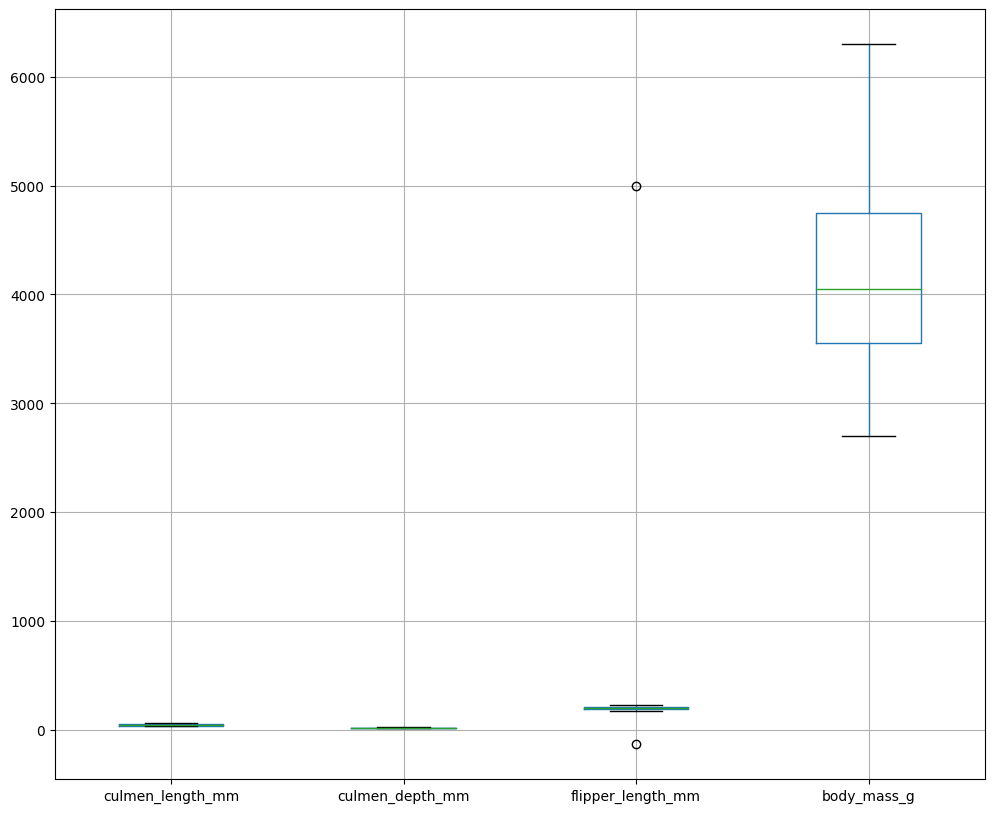

In [7]:
# check for outliers or incorrect data
plt.figure(figsize=(12,10))
df.boxplot()

It looks like flipper length has one huge outlier and one incorrect negative number, so let's remove those points

In [8]:
print(df[df["flipper_length_mm"] > 4000])
print(df[df["flipper_length_mm"] < 0])

   culmen_length_mm  culmen_depth_mm  flipper_length_mm  body_mass_g   sex
9              42.0             20.2             5000.0       4250.0  MALE
    culmen_length_mm  culmen_depth_mm  flipper_length_mm  body_mass_g   sex
14              34.6             21.1             -132.0       4400.0  MALE


In [9]:
#drop rows 9 and 14 that have the weird data points
penguin_df = df.drop([9, 14], inplace=True)

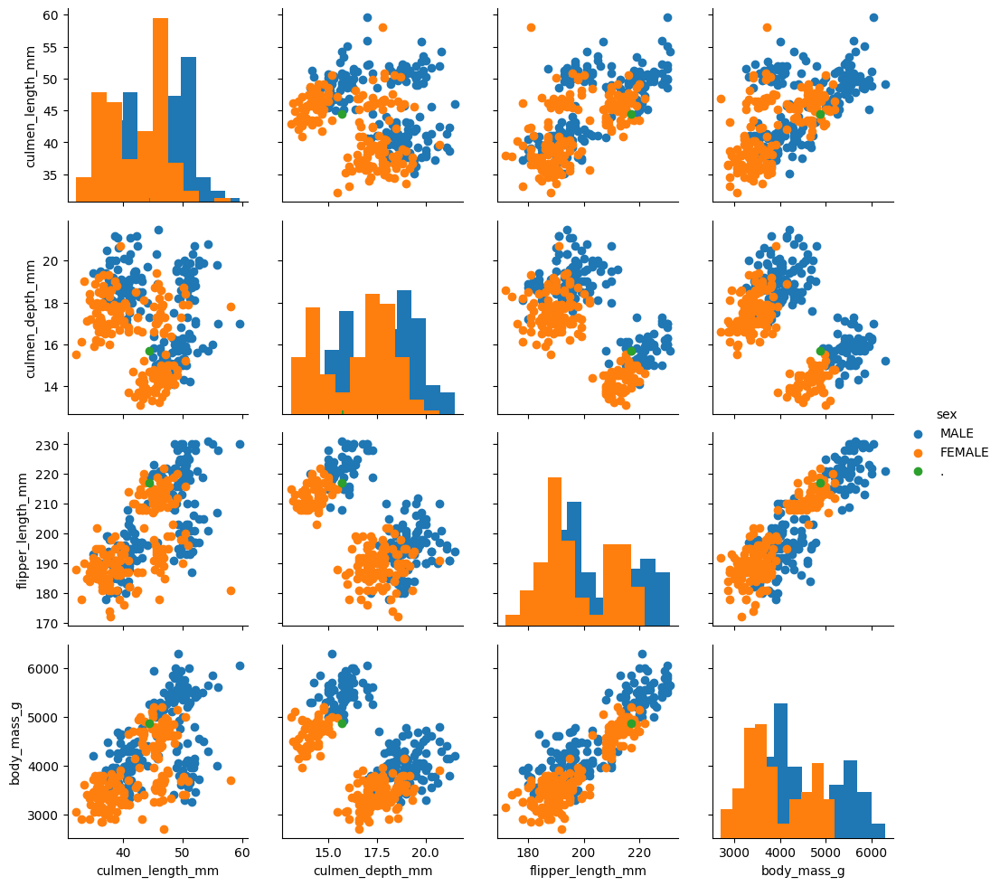

In [10]:
g = sns.PairGrid(df, hue="sex")
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend()

Looking at the plots above, we can see distinct differences in the male and female penguin masurements for both species , with females having smaller measurements in most categories. There is also an odd green point, so let's check the unique values for 'sex'

In [11]:
df['sex'].unique()

array(['MALE', 'FEMALE', nan, '.'], dtype=object)

The '.' does not belong, so let's make it a null so we can drop it with the other nulls

In [12]:
#replace '.' with null value
df['sex'] = df['sex'].replace(".", np.nan)

There were some null values for 'sex' so let's drop those

In [13]:
#drop nulls
penguin_df = df.dropna()

In [14]:
#get dummies for male and female (and check that the nulls and '.' are gone)

pd.get_dummies(df['sex'])


,FEMALE,MALE
0,0,1
1,1,0
2,1,0
3,0,0
4,1,0
...,...,...
339,0,0
340,1,0
341,0,1
342,1,0


In [15]:
#add dummies to dataframe
penguin_df = pd.concat([penguin_df, pd.get_dummies(penguin_df['sex'])], axis = 1)

In [16]:
# drop 'sex' and 'FEMALE' columns
penguin_df = penguin_df.drop(['sex'], axis = 1)
penguin_df = penguin_df.drop(['FEMALE'], axis = 1)

In [17]:
#rename 'MALE' to 'sex'
penguin_df.rename(columns = {'MALE' : 'sex'}, inplace = True)

In [18]:
# check that the columns were dropped/renamed correctly

penguin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 332 entries, 0 to 343
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   culmen_length_mm   332 non-null    float64
 1   culmen_depth_mm    332 non-null    float64
 2   flipper_length_mm  332 non-null    float64
 3   body_mass_g        332 non-null    float64
 4   sex                332 non-null    uint8  
dtypes: float64(4), uint8(1)
memory usage: 13.3 KB


In [19]:
# set X and y

# Define the features and the outcome
#X is every column except 13
X = penguin_df.iloc[:, :4].values
#y is column 13
y = penguin_df.iloc[:, 4].values

# Standardize and apply PCA

In [20]:
#Standardize the features
scaler = StandardScaler()
X_std = scaler.fit_transform(penguin_df)
new_df = pd.DataFrame(data = X_std, columns = penguin_df.columns)


pca = PCA(n_components=2).fit_transform(X_std)

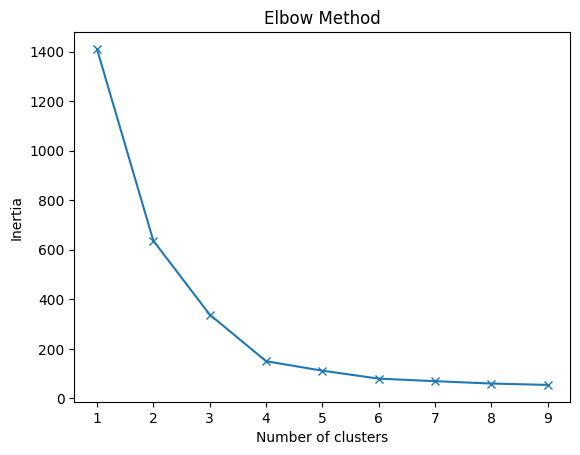

In [21]:
# use elbow method to determine optimal number of clusters

sse = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(pca)
    sse.append(kmeans.inertia_)
plt.plot(range(1, 10), sse, marker="x")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method")
plt.show()

Optimal number of clusters is 4

# Apply k-means

In [22]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=4, random_state=123)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

337 ms ± 140 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


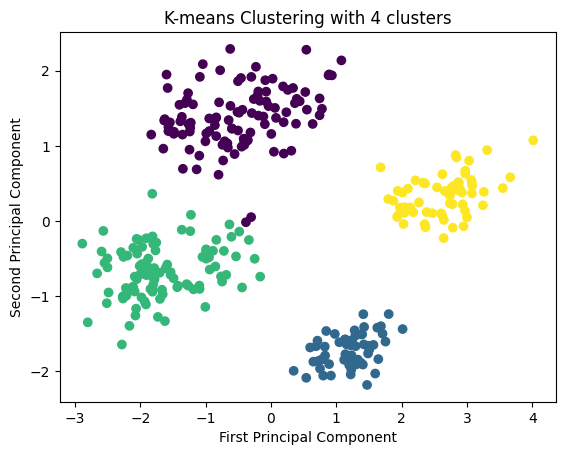

In [23]:
kmeans = KMeans(n_clusters=4, random_state=42).fit(pca)
plt.scatter(pca[:, 0], pca[:, 1], c=kmeans.labels_, cmap="viridis")
plt.xlabel("First Principal Component")
plt.ylabel("Second Principal Component")
plt.title(f"K-means Clustering with 4 clusters")
plt.show()

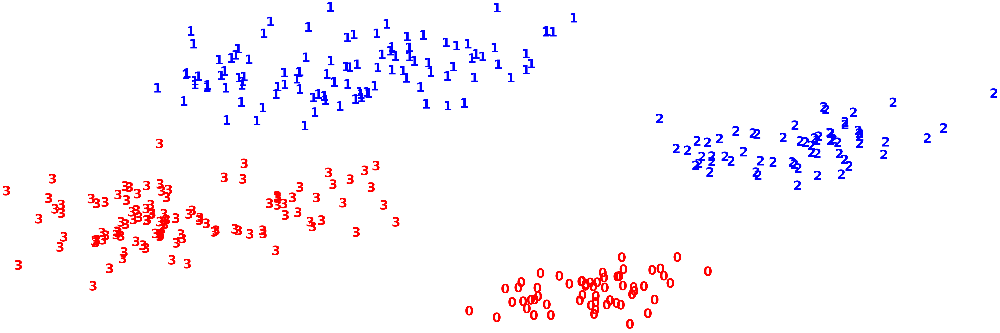

In [24]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

There is pretty good separation between the groups here, and each of the groups has distinct cluusters of the same number assignment. The colors indicate that there are two groups of each sex (male/female) indicating that we are likely looking at just two species of penguins, separated into two groups each by sex.

In [25]:
from sklearn import metrics

# get ARI and silhouette scores
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, y_pred)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, y_pred, metric='euclidean')))

Adjusted Rand Index of the Agglomerative Clustering solution: 0.5381071197163467
The silhouette score of the Agglomerative Clustering solution: 0.5085922485155359


The ARI score and the silhouette coefficient are good (for ARI score, closer to 1 means the assignments were closer to perfect and a score closer to -1 means the assignments are closer to random. For silhouette score, closer to 1 means good clusters, closer to -1 means bad clusters)

# Dimensionality reduction with t-SNE

Hyperparameters: perplexity = 10, iterations = 300

In [26]:
time_start = time.time()
tsne = TSNE(n_components=2, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 0.4882688522338867 seconds


In [27]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This representation of the reduced dimensionality is not very good, and has many vague groups of a few points instead of good clusters. Let's try tuning the hyperparameters some.

Hyperparameters: perplexity = 30, iterations = 300

In [28]:
time_start = time.time()
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 2.527456760406494 seconds


In [29]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The depiction of the data here looks almost like a wavy line... Let's try retunring the perplexity to 10 but increasing the iterations

Hyperparameters: perplexity = 10, iterations = 500

In [30]:
time_start = time.time()
tsne = TSNE(n_components=2, perplexity=10, n_iter=400)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 0.6063640117645264 seconds


In [31]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This representation of the data was not able to be rendered. Based on how much clearer clusters we got from k-means, let's move on.

# Dimensionality reduction with UMAP

Hyperparameters: n_neighbors = 5, min_dist = 0.3

In [32]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 12.072436332702637 seconds


In [33]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This dimensioanlity reduction representation also does not look very good, as there are groups, but they are many and the divisions between them are pretty vague. Let's try tuning the hyperparameters here and seeing if we can get clearer clusters

Hyperparameters: n_neighbors = 10, min_dist = 0.8

In [44]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.8,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 7.8910698890686035 seconds


In [45]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This is a little more spread out than the above representation, but the groups are heavily overlapping. Let's try tuning the hyperparameters one more time.

Hyperparameters: n_neighbors = 20, min_dist = 1

In [47]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=20,
                      min_dist=1,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 3.5717105865478516 seconds


In [48]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

We are starting to see some separation between red data on the left and blue data on the right, but there is still no distinct separation between groups.

PCA looks like the best method for dimensionality reduction here, as the other methods were not able to give clear distinct clusters.

Let's look at other clustering methods and see if any of them perform better than the k-means

# Hierarchial clustering

Hyperparameters: linkage = complete, affinity = cosine

In [34]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete',
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

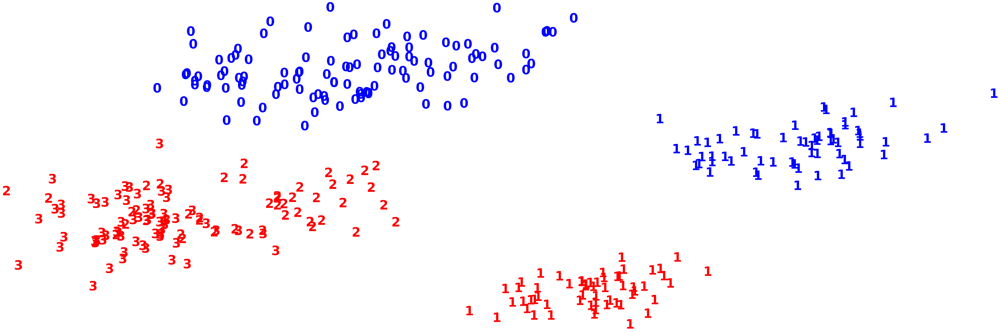

In [35]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This clusering method doesn't seem to be doing as well in assigning the clusters. Two separate groups that belong to different classes were both classified as 1, and one group of the red class was assigned into two separate groups

In [36]:
# get ARI and silhouette scores
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the Agglomerative Clustering solution: 0.3088964716146078
The silhouette score of the Agglomerative Clustering solution: 0.39325834275075383


These are both lower than the scores for kmeans. Let's try changing the linkage parameter

Hyperparameters: linkage = ward, affinity = euclidean

In [49]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='ward',
                                      affinity='euclidean',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

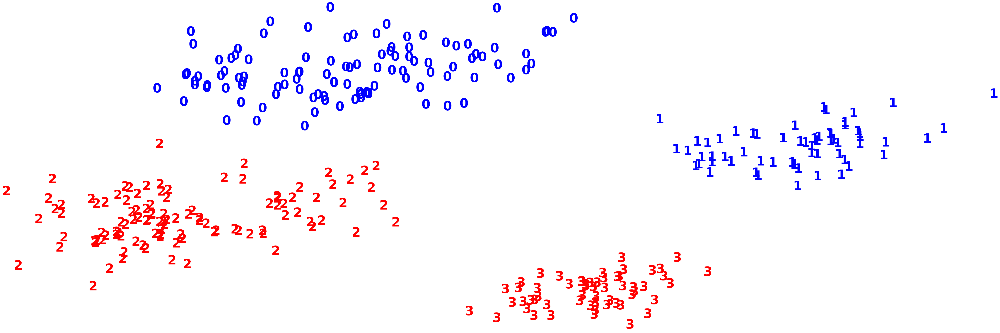

In [50]:

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [51]:
# get ARI and silhouette scores
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the Agglomerative Clustering solution: 0.5381071197163467
The silhouette score of the Agglomerative Clustering solution: 0.5085922485155359


This version had higher scores than the previous one, and the same scores as the k-means.

Hyperparameters: linkage = average, affinity = cosine

In [53]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='average',
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

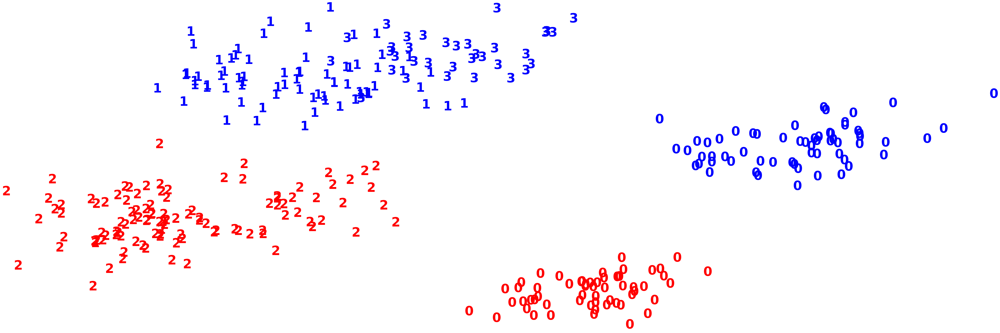

In [54]:

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [55]:
# get ARI and silhouette scores
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the Agglomerative Clustering solution: 0.31999877565848117
The silhouette score of the Agglomerative Clustering solution: 0.4454867378636067


These scores were lower than the previous method.

Hyperparameters: linkage = single, affinity = cosine

In [56]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='single',
                                      affinity='cosine',
                                      n_clusters=4)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

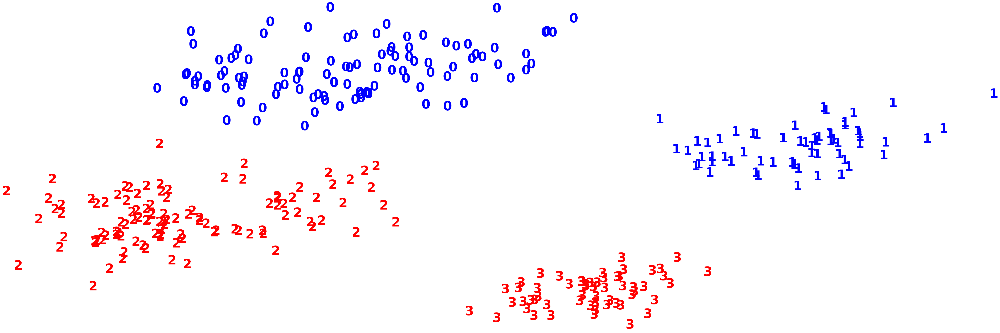

In [57]:

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [58]:
# get ARI and silhouette scores
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the Agglomerative Clustering solution: 0.5381071197163467
The silhouette score of the Agglomerative Clustering solution: 0.5085922485155359


This version had the same scores as the ward method and the K-means

# DBSCAN method of clustering

In [37]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

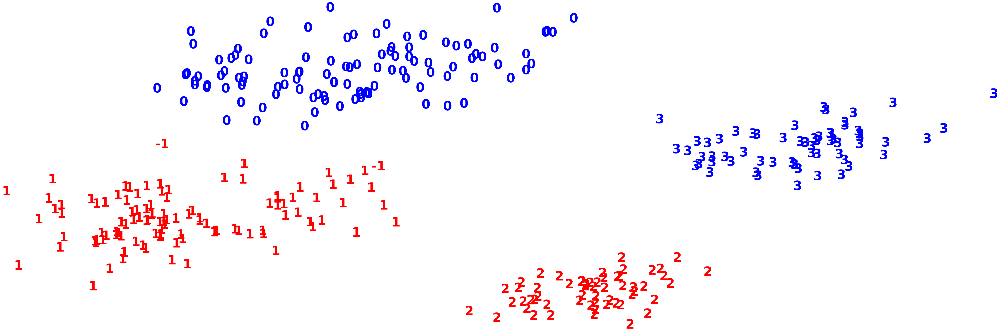

In [38]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This method did a better job than the previous one in assigning the four groups. Let's check the ARI and silhouette scores

In [39]:
# get ARI and silhouette scores
print("Adjusted Rand Index of the Agglomerative Clustering solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the Agglomerative Clustering solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the Agglomerative Clustering solution: 0.5304419170561502
The silhouette score of the Agglomerative Clustering solution: 0.49167917798215593


Since the k-means performed well, let's try using Gaussian Mixture Modeling to see if that can do even better

Gaussian Mixture Model

In [40]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components = 4, random_state = 123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

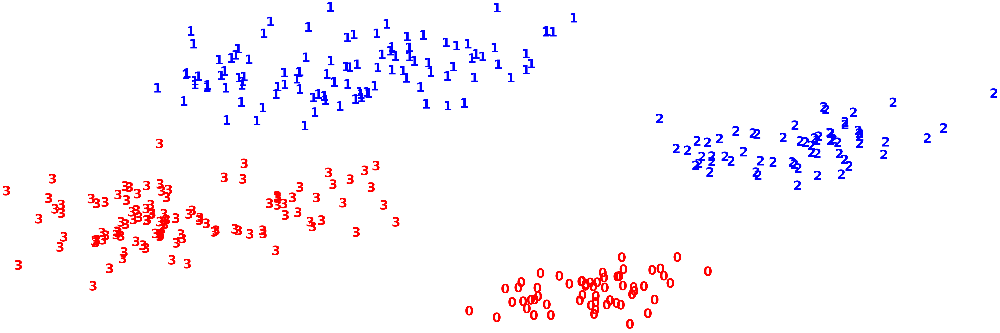

In [41]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

This clustering method showed a good separation between the four groups. Let's check the ARI and silhouette scores.

In [42]:
print("Adjusted Rand Index of the GMM solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))


Adjusted Rand Index of the GMM solution: 0.5381071197163467
The silhouette score of the GMM solution: 0.5085922485155359


# Comparison of methods:

K-means (ARI: 0.5381, silhouette: 0.5085)

Hierarchial: complete (ARI: 0.3088, silhouette: 0.3932)

Hierarchial: ward / single (ARI: 0.5381, silhouette: 0.5085)

DBSCAN (ARI: 0.5304, silhouette: 0.4916)

GMM (ARI: 0.5381, silhouette: 0.5085)

Looking at the ARI and silhouette scores for each method, the GMM clustering method, the k-means method, and two of the hierarchial methods tied, so any of those would be good for this dataset

Let's look at the contingency table for the k-means

In [43]:
# Get predicted clusters
full_pred = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)

pd.crosstab(y, full_pred)

col_0,0,1,2,3
row_0,,,,
0,58,0,0,107
1,0,106,61,0


All of the tabulations for group 0 are assigned to groups 0 and 3, and all of the tabulations for group 1 are assigned to groups 1 and 2.

For this dataset, dimensionality reduction helped to visualize the penguin measurement data in simplified groups, with the four groups showing the separation between male and female penguins from the two species measured. This information can give us further insight when it comes to penguin species identification based on size measurements